# Life Expectancy Prediction and Analysis - What factors impact life span?
## Intermediate Progress

*95-885 Data Science and Big Data - Project 2: Adding Value via Machine Learning*

**Team 12<br>
Blake Tian (sixuant)<br>
Yuran Zhu (yuranz)**

### Content
[1. Overview](#Overview)<br>
[2. Data Preprocessing](#Data-Preprocessing)<br>
[3. Exploratory Data Analysis](#Exploratory-Data-Analysis)<br>
[4. Data Preparation](#Data-Preparation)<br>
[5. Models](#Models)<br>
[6. Future Work](#Future-Work)

# Overview

With the dataset, we expect to build a **regression** model for predicting life expentancy. We plan to consider multiple regression models and evaluate model performance with the `Root Mean Squared Error (RMSE) and R-Squared`. With hyperparameters fine-tuning, we’ll select the model with the best performance. Finally, we'll interpret the model results and conclude insights wih repsect to healthcare and development aspect as well as business. Meanwhile, we
plan to perform basic **clustering** for unsupervised learning, aiming to group countries based on various indicators, and thereby to map the similarity and gap among countries. We hope to eventually visualize clusters on a world map, to trigger more insights for the international organizations on leveraging and promoting the global development.

So far, we have completed the following work:
- Data preprocessing
- Exploratory data analysis, including missing values, feature correlations, feature distributions and life expectancy visualization with the world map
- Data preparation including imputing data and encoding categorical features
- Compare basic models without hyperparamters tuning and explore feature importance
- Initial exploration for Clustering


# Data Preprocessing

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.graph_objs as go
import plotly.offline as py
from plotnine import *
import plotly.express as px
import plotly.figure_factory as ff
import country_converter as coco
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.cluster import KMeans
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error

import warnings
warnings.filterwarnings('ignore')

## 1. Load Data and Inspect

In [4]:
df = pd.read_csv('Life_expectancy_data.csv')
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [5]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

We can find some columns have trailing spaces, which should be removed for better column identifying. We'll also replace the inside spaces with underscores and rename some too-long columns.

## 2. Rename Columns and Change Data Type

In [6]:
# Remove trailing spaces, replace inside space with underscore
df.rename(columns=lambda x: x.strip().replace(' ', '_'), inplace=True)
df.columns

Index(['Country', 'Year', 'Status', 'Life_expectancy', 'Adult_Mortality',
       'infant_deaths', 'Alcohol', 'percentage_expenditure', 'Hepatitis_B',
       'Measles', 'BMI', 'under-five_deaths', 'Polio', 'Total_expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness__1-19_years',
       'thinness_5-9_years', 'Income_composition_of_resources', 'Schooling'],
      dtype='object')

In [7]:
# Renaming some columns as they are too long and to follow consistent case order
df.rename(columns = {'Adult_Mortality': 'Adult_mortality', 'infant_deaths': 'Infant_deaths', 
                     'percentage_expenditure': 'Percentage_exp', 
                     'under-five_deaths': 'Under-five_deaths',
                     'Total_expenditure': 'Total_exp',
                     'thinness__1-19_years': 'Thinness_1to19_years', 
                     'thinness_5-9_years': 'Thinness_5to9_years',
                     'Income_composition_of_resources': 'Income_comp'}, inplace=True)
df.columns 

Index(['Country', 'Year', 'Status', 'Life_expectancy', 'Adult_mortality',
       'Infant_deaths', 'Alcohol', 'Percentage_exp', 'Hepatitis_B', 'Measles',
       'BMI', 'Under-five_deaths', 'Polio', 'Total_exp', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'Thinness_1to19_years',
       'Thinness_5to9_years', 'Income_comp', 'Schooling'],
      dtype='object')

In [8]:
# Inspect data types and non-null values count
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Country               2938 non-null   object 
 1   Year                  2938 non-null   int64  
 2   Status                2938 non-null   object 
 3   Life_expectancy       2928 non-null   float64
 4   Adult_mortality       2928 non-null   float64
 5   Infant_deaths         2938 non-null   int64  
 6   Alcohol               2744 non-null   float64
 7   Percentage_exp        2938 non-null   float64
 8   Hepatitis_B           2385 non-null   float64
 9   Measles               2938 non-null   int64  
 10  BMI                   2904 non-null   float64
 11  Under-five_deaths     2938 non-null   int64  
 12  Polio                 2919 non-null   float64
 13  Total_exp             2712 non-null   float64
 14  Diphtheria            2919 non-null   float64
 15  HIV/AIDS             

According to the data set description, the data types seems correct. We can also inspect on some basic statistics for columns in the dataset.

In [9]:
# Categorical variables
df.describe(exclude = np.number).transpose()

,count,unique,top,freq
Country,2938,193,Montenegro,16
Status,2938,2,Developing,2426


In [10]:
# Continuous variables
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Year,2938.0,2.007519e+03,4.613841e+00,2000.00000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Life_expectancy,2928.0,6.922493e+01,9.523867e+00,36.30000,63.100000,7.210000e+01,7.570000e+01,8.900000e+01
Adult_mortality,2928.0,1.647964e+02,1.242921e+02,1.00000,74.000000,1.440000e+02,2.280000e+02,7.230000e+02
Infant_deaths,2938.0,3.030395e+01,1.179265e+02,0.00000,0.000000,3.000000e+00,2.200000e+01,1.800000e+03
Alcohol,2744.0,4.602861e+00,4.052413e+00,0.01000,0.877500,3.755000e+00,7.702500e+00,1.787000e+01
Percentage_exp,2938.0,7.382513e+02,1.987915e+03,0.00000,4.685343,6.491291e+01,4.415341e+02,1.947991e+04
Hepatitis_B,2385.0,8.094046e+01,2.507002e+01,1.00000,77.000000,9.200000e+01,9.700000e+01,9.900000e+01
Measles,2938.0,2.419592e+03,1.146727e+04,0.00000,0.000000,1.700000e+01,3.602500e+02,2.121830e+05
BMI,2904.0,3.832125e+01,2.004403e+01,1.00000,19.300000,4.350000e+01,5.620000e+01,8.730000e+01
Under-five_deaths,2938.0,4.203574e+01,1.604455e+02,0.00000,0.000000,4.000000e+00,2.800000e+01,2.500000e+03


In [11]:
# Export renamed dataset
df.to_csv(r'cleaned_life_expectancy.csv', index = False)

# Exploratory Data Analysis

In the Exploratory Data Analysis (EDA), we mainly focus on analyze the data from the following aspects:
- The proportion of **andmissing values** for each column
- **Correlations** between all columns
- **Distributions** of some columns of interest
- Explore the difference between countries on **2015 life expectancy** via the world map


## 1. Missing Value

In [12]:
# Define missing plot to detect all missing values in dataset
def missing_plot(dataset, key) :
    '''
    Takes a dataset and key, calculates the count and % of missing values for each column
    Outputs a plot for highlight results
    '''
    null_feat = pd.DataFrame(dataset.isnull().sum(), columns = ['Count'])
    percentage_null = pd.DataFrame((len(dataset[key]) - (len(dataset[key]) - dataset.isnull().sum()))/len(dataset[key])*100, columns = ['Count'])
    percentage_null = percentage_null.round(2)

    trace = go.Bar(x = null_feat.index, y = null_feat['Count'] ,opacity = 0.8, 
                   text = percentage_null['Count'],  textposition = 'auto',
                   marker=dict(color = '#7EC0EE',
                   line=dict(color='#000000',width=1.5)))

    layout = dict(title =  "Missing Values (count & %)")

    fig = dict(data = [trace], layout=layout)
    fig['layout'].update(width=800, height=400)
    py.iplot(fig)

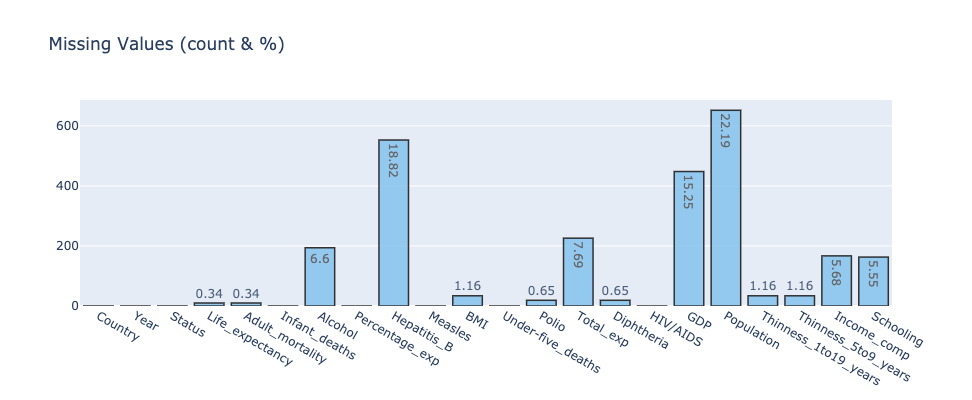

In [13]:
# Plotting 
missing_plot(df, 'Life_expectancy')

In total, 14 columns have missing values. Three columns `Hepatitis_B, GDP, Population` contain missing values that are over 10% of the entries. Considering the proportions are not too high, we won't simply drop those columns. Instead, we'll impute all those missing values in the `Data Preparation` section.

Meanwhile, we are also thinking about the reasons why those three columns have comparatively high proportion of missing values. We suppose that:
- `Hepatitis_B` is in the aspect of public health, for some rural countries, they may fail to test and record for it.
- Similarily, rural countries might miss data for `GDP` and `Population`.


## 2. Feature Correlation

Then we explore the correlations among all the columns.

Text(0.5, 1.0, 'Heatmap of Features Correlations')

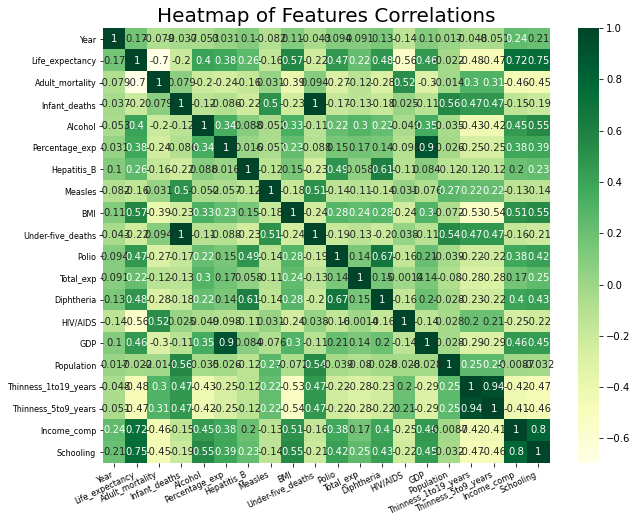

In [14]:
cor = df.corr()
# correlation plot---heatmap
plt.figure(figsize=(10,8))
g = sns.heatmap(cor,annot=True,cmap = "YlGn")
g.tick_params(labelsize=8)
g.set_xticklabels(g.get_xticklabels(), rotation=25, horizontalalignment='right')
plt.title('Heatmap of Features Correlations', fontsize = 20)

Generally, most of the correlation coefficients are below 0.6. Those columns display higher correlations:
- `thinness_1to19_years` and `thinness_5to9_years`: 0.94
- `GDP` and `Percentage_exp`: 0.89
- `Income_comp` and `Schooling`: 0.8
- `Schooling` and `Life_expectancy`: 0.72
- `Income_comp` and `Life_expectancy`: 0.69
- `Polio` and `Diphtheria`: 0.68

It seems reasonable to detect the high positive correlations. For example, 
- In countries with higher schooling level, people are more educated and tend to understand as well as master the ways to keep healthy.
- For countries with higher  Gross Domestic Product (GDP), they may tend to spend more on healthcare, which leads to higher `Percentage_exp`.
- With higher `Income_comp` (A Human Development Index in terms of income composition of resources), countries tend to have longer average life expectancy due to better living standards and conditions.

## 3. Distribution

Besides and distribution for single column, we're also interested in the patterns of column distribution in relation to different life expectancy segments. 

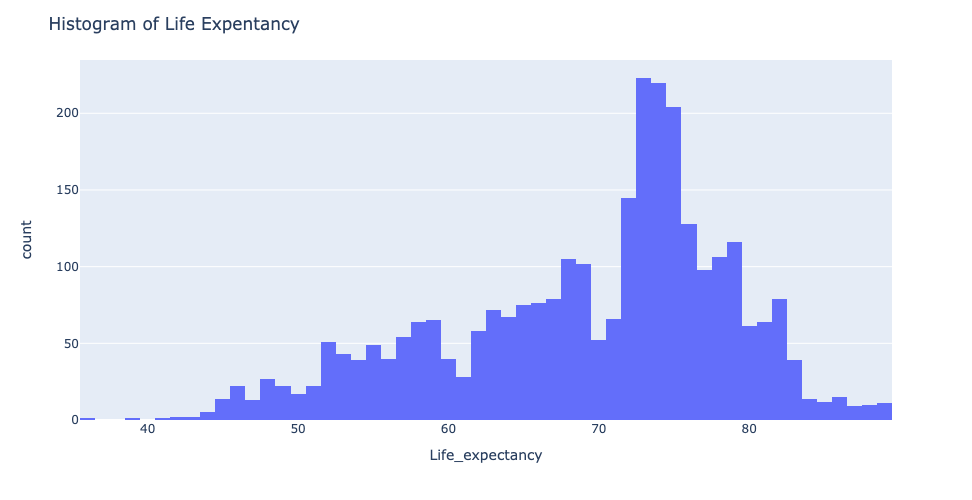

In [15]:
fig = px.histogram(df, x = 'Life_expectancy')
fig.update_layout(title_text = 'Histogram of Life Expentancy', width=1000, height=500,)
fig.show()

We mainly divide `Life_expectancy` into 5 segments: `Fifties_below, Fifties, Sixties, Seventies, Eighties_above`. 

In [16]:
# Divide 5 levels for Life_expectancy
Fifties_below = df.loc[(df['Life_expectancy'] >= 30) & (df['Life_expectancy'] < 50)]
Fifties = df.loc[(df['Life_expectancy'] >= 50) & (df['Life_expectancy'] < 60)]
Sixties = df.loc[(df['Life_expectancy'] >= 60) & (df['Life_expectancy'] < 70)]
Seventies = df.loc[(df['Life_expectancy'] >= 70) & (df['Life_expectancy'] < 80)]
Eighties_above = df.loc[(df['Life_expectancy'] >= 80) & (df['Life_expectancy'] < 90)]

In [17]:
def plot_distribution(data_select, size_bin):
    '''
    Takes in the column to visualize and the defined size of bin
    Outputs a density plot for the column grouped by different life_expectancy levels
    '''
    below_fif = Fifties_below[data_select].fillna(0).to_numpy()
    fif = Fifties[data_select].fillna(0).to_numpy()
    six = Sixties[data_select].fillna(0).to_numpy()
    seven = Seventies[data_select].fillna(0).to_numpy()
    eight_above = Eighties_above[data_select].fillna(0).to_numpy()

    age_ranges = [below_fif, fif, six, seven, eight_above] 
    group_labels = ['Fifties_below', 'Fifties', 'Sixties', 'Seventies', 'Eighties_above']
    colors = ['#DE172E', '#F58F00', '#E8D65E', '#C2D770', '#80BF22']

    fig = ff.create_distplot(age_ranges, group_labels, colors = colors, show_hist = True,\
                             bin_size = size_bin, curve_type='kde', show_rug = False)

    fig['layout'].update(width=700, height=350)
    fig.update_layout(title=data_select +' Distribution Plot')

    py.iplot(fig, filename = 'Density plot')

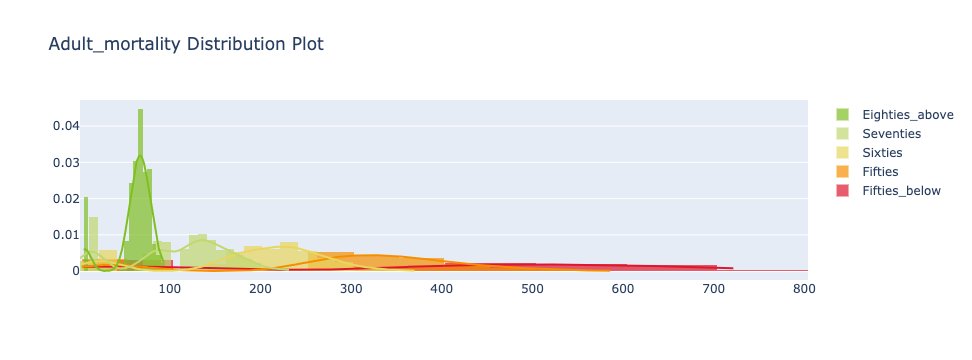

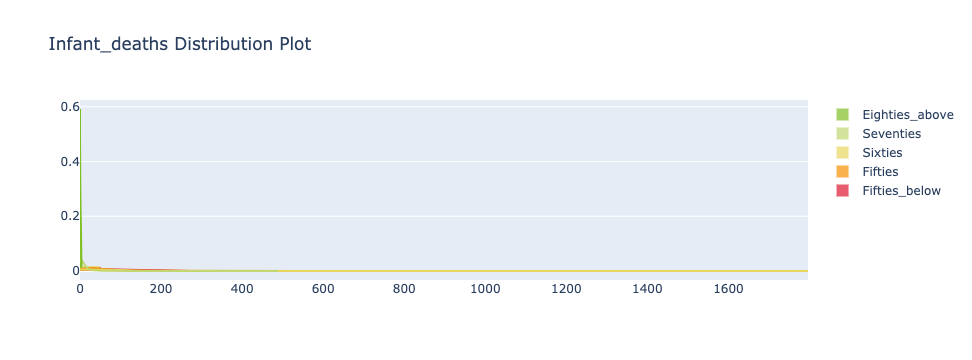

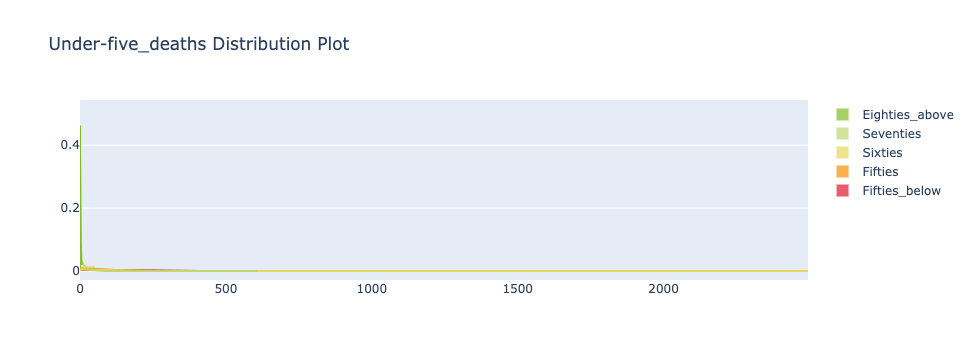

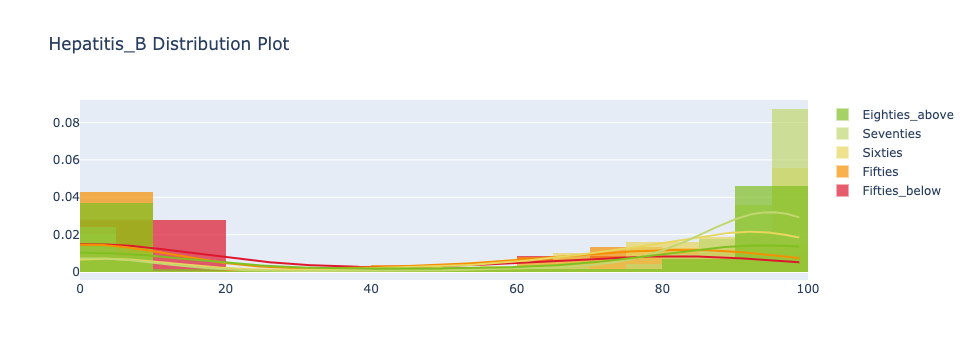

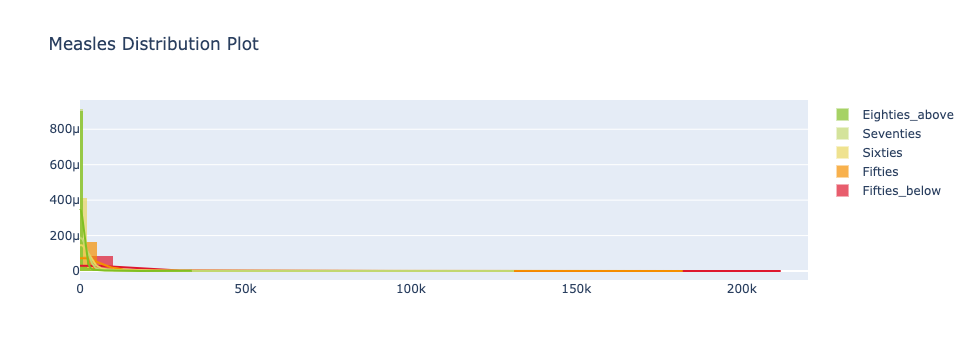

...

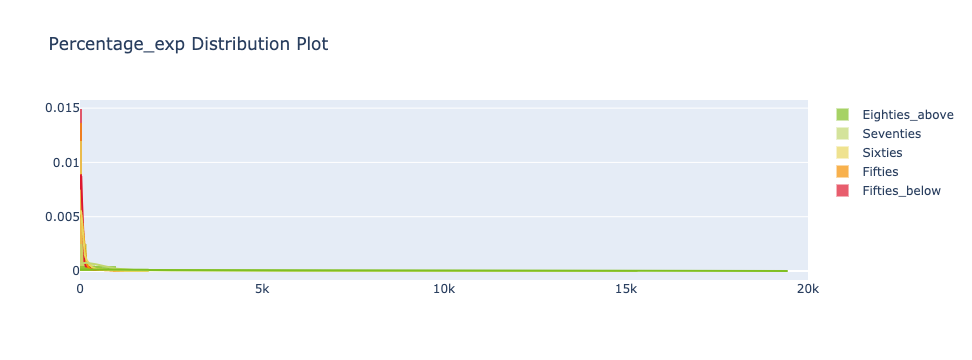

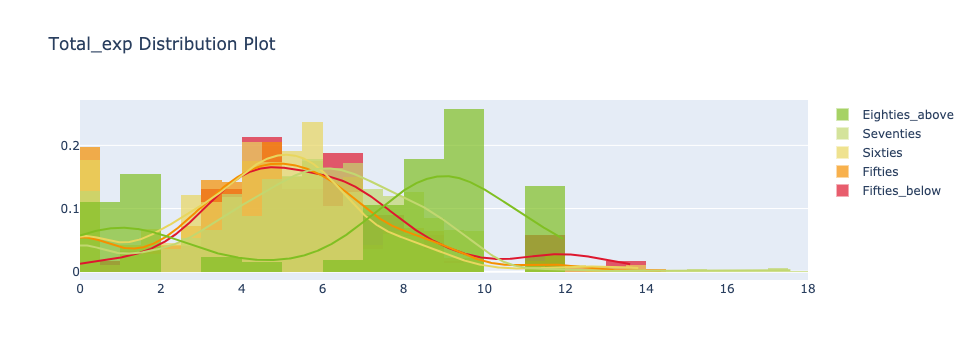

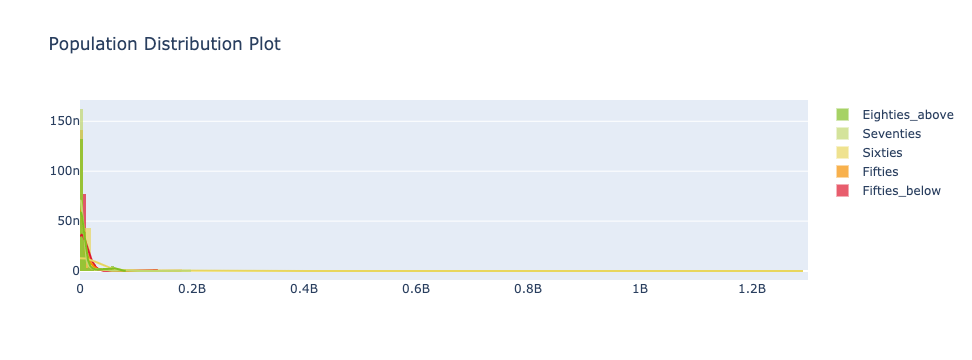

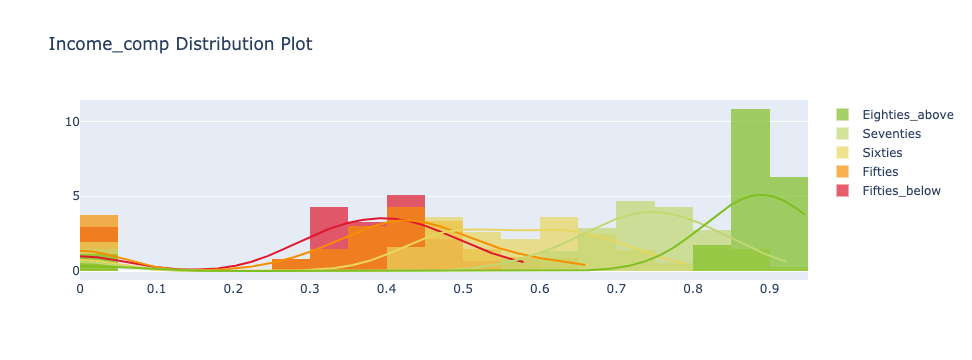

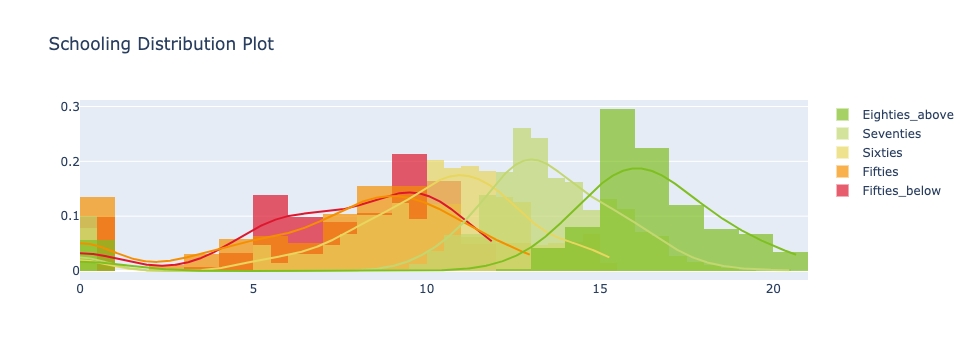

In [18]:
# Select features of interest
dist_plot_features = ['Adult_mortality', 'Infant_deaths', 'Under-five_deaths', 'Hepatitis_B', 'Measles', 'BMI', 
                      'Thinness_1to19_years', 'Polio', 'Diphtheria', 'HIV/AIDS', 'Alcohol',
                      'GDP', 'Percentage_exp', 'Total_exp', 'Population',  
                      'Income_comp', 'Schooling']

for features in dist_plot_features: 
    plot_distribution(features, 0) 

We can draw some intersting insights from the grouped distribution, such as:
- As the life expectancy level improves, the mode of `Adult_mortality` decreases
- The distributions of `Infant_deaths` and `Under-five_deaths` are similar: As the life expectancy level improves, countires tend to have more lower value of these two attributes
- `Fifties_below, Fifties, Sixties` group have similar mode of `BMI`, while `Seventies, Eighties_above` group have another similar mode.
- The distributions of `Polio`, `Diphtheria` and `Hepatitis_B` are similar: For countries with higher life expectancy level, more people are  with immunization of these three diseases.
- Groups display similar distributions of `Total_exp`, `GDP`, `Percentage_exp` except `Eighties_above`
- As the life expectancy level improves, the distribution of `Schooling` becomes much more like normal distribution

## 4. Map

Next, we plot the world choropleth map for countries' life expectancy in 2015.

In [19]:
# life expectancy as for 2015
df_2015 = df[df['Year'] == 2015] 
df_2015 = df_2015.reset_index()
df_2015 = df_2015[['Country', 'Life_expectancy']]
df_2015['Code'] = [coco.convert(names=n, to='ISO3', not_found=None) for n in df_2015['Country'].values]

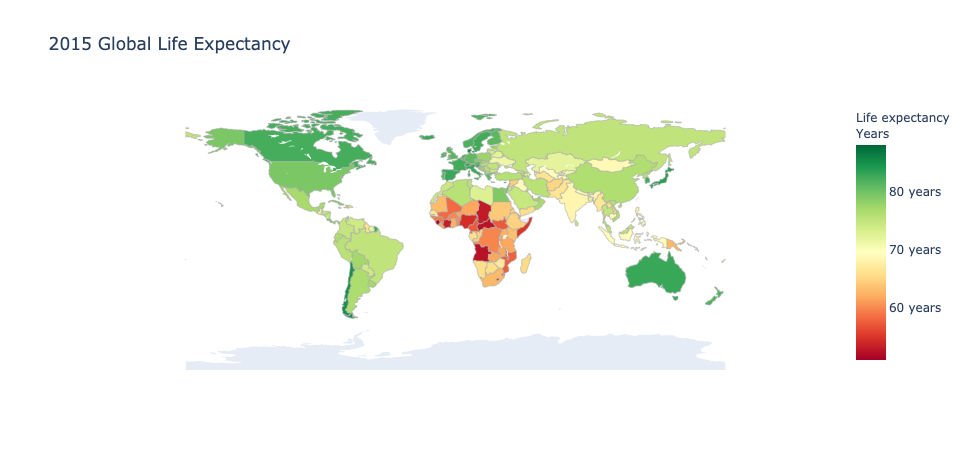

In [20]:
fig = go.Figure(data=go.Choropleth(
    locations = df_2015['Code'],
    z = df_2015['Life_expectancy'],
    text = df_2015['Country'],
    colorscale = 'RdYlGn',
    autocolorscale=False,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorbar_ticksuffix = ' years',
    colorbar_title = 'Life expectancy<br>Years',
))

fig.update_layout(
    title_text='2015 Global Life Expectancy',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    )
)

fig.show()

Here, we can notice the following pattern of life expectancy:
- Australia, European countries, and North America have the highest life expectancy in 2015
- South Amerian countries also show comparatively higher values of life expectancy 
- Most of the Asian countries have medium level of life expectancy in 2015
- African countries tend to have comparatively low life expectancy

This is kind of intuitive due to the developing disparity in terms of economics, technology, healthcare, etc.


# Data Preparation

## 1. Data Imputaion

For numeric columns, some of them have **missing values**. Since the proportions of missing values are comparatively low, it's not appropriate to drop the whole column. Thereby, we'll impute those missing values. The way we are using to impute the missing values is to fill them with the **mean values** of the column for different countries.

In [21]:
# Country list
country_lst = df['Country'].unique()
# Column list that contain missing values
fill_col_lst = list(df.count()[df.count() != 2938].index)

In [22]:
# Impute missing values with mean values for each country
for col in  fill_col_lst:
    df[col] = df.groupby('Country')[col].transform(lambda x: x.fillna(x.mean()))

In [23]:
df.isnull().sum()

Country                   0
Year                      0
Status                    0
Life_expectancy          10
Adult_mortality          10
Infant_deaths             0
Alcohol                  17
Percentage_exp            0
Hepatitis_B             144
Measles                   0
BMI                      34
Under-five_deaths         0
Polio                     0
Total_exp                32
Diphtheria                0
HIV/AIDS                  0
GDP                     405
Population              648
Thinness_1to19_years     34
Thinness_5to9_years      34
Income_comp             167
Schooling               163
dtype: int64

It turns out some columns are still missing values. It's becasue for some countries, they weren't been recorded data during 2001-2015 for some columns. Hence, we'll further impute those missing values with mean value of all other available countries in the specific year.

In [24]:
# Impute missing values with mean values for all countries in the year
for year in df['Year'].unique():
    df[df['Year'] == year] = df[df['Year'] == year].fillna(df[df['Year'] == year].mean())

Check for missing values again. The result below shows there's no NA value. We'll export and save the prepared dataset and build models based on this new dataset.

In [25]:
df.isnull().sum()

Country                 0
Year                    0
Status                  0
Life_expectancy         0
Adult_mortality         0
Infant_deaths           0
Alcohol                 0
Percentage_exp          0
Hepatitis_B             0
Measles                 0
BMI                     0
Under-five_deaths       0
Polio                   0
Total_exp               0
Diphtheria              0
HIV/AIDS                0
GDP                     0
Population              0
Thinness_1to19_years    0
Thinness_5to9_years     0
Income_comp             0
Schooling               0
dtype: int64

## 2. Encode Categorical Features

The only categorical feature in the dataset is `Status`, referring to whether a country is a developed or a developing country. 

In [26]:
# Encode
status_ohe = pd.get_dummies(df['Status'])
status_ohe.head()

,Developed,Developing
0,0,1
1,0,1
2,0,1
3,0,1
4,0,1


In [27]:
# Add new columns
df = pd.concat([df, status_ohe], axis=1)
df.drop('Status', axis = 1, inplace = True)
df.head()

,Country,Year,Life_expectancy,Adult_mortality,Infant_deaths,Alcohol,Percentage_exp,Hepatitis_B,Measles,BMI,...,Diphtheria,HIV/AIDS,GDP,Population,Thinness_1to19_years,Thinness_5to9_years,Income_comp,Schooling,Developed,Developing
0,Afghanistan,2015,65.0,263.0,62,0.01,71.279624,65.0,1154,19.1,...,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1,0,1
1,Afghanistan,2014,59.9,271.0,64,0.01,73.523582,62.0,492,18.6,...,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0,0,1
2,Afghanistan,2013,59.9,268.0,66,0.01,73.219243,64.0,430,18.1,...,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9,0,1
3,Afghanistan,2012,59.5,272.0,69,0.01,78.184215,67.0,2787,17.6,...,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8,0,1
4,Afghanistan,2011,59.2,275.0,71,0.01,7.097109,68.0,3013,17.2,...,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5,0,1


In [28]:
# Export the transformed dataset
df.to_csv(r'new_life_expectancy.csv', index = False)

# Models

As we have discussed in the project proposal, the main question for us is to predict the life expectancy which can be treated as a **Regression** problem. Meanwhile, we are also interested in exploring the similarity and difference among all countries with our current dataset, so we will try **Clustering** to search some insights.

## 1. Prediction

### 1.1 Explore Basic Models (without Hyperparameter-tuning)

We first look at basic models without hyperparameter-tuning, and we'll score those models with 10-fold cross validation. The scoring methods we're using in the regression problem is `RMSE` and `R-Squared`, and we lay more emphasis on `RMSE`.

In [28]:
# Get X,y and split for train and test
model_df = df.set_index('Country')
X = model_df.drop('Life_expectancy',axis = 1)
y = model_df['Life_expectancy']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=1)

In [29]:
# Define functions to calculate RMSE/R-squared with CV
# CV score for RMSE
def rmse_cv(model, n_splits = 10):
    '''
    Takes a model and calculated the RMSE for each split in K-fold cross validation
    Default K = 10
    '''
    kf = KFold(n_splits, shuffle=True, random_state = 1).get_n_splits(model_df)
    return - cross_val_score(model, X_train, y_train, cv=kf, scoring='neg_root_mean_squared_error')

# CV score for R-Sq
def r2_cv(model, n_splits = 10):
    '''
    Takes a model and calculated the R-Squared for each split in K-fold cross validation
    Default K = 10
    '''
    kf = KFold(n_splits, shuffle=True, random_state = 1).get_n_splits(model_df)
    return cross_val_score(model, X_train, y_train, cv=kf, scoring='r2')

We then explore some models of interest, including **Multi-linear Regression, Ridge Regression, Lasso Regression, Decision Tree Regression, Random Forest Regression, SVR Regression**. We also calculate the RMSE of the baseline, i.e., using the mean values of `y_train` as predicted values.

In [30]:
# Baseline: using mean values
y_pred_base = np.ones(len(y_test)) * y_train.mean()
rmse_base = mean_squared_error(y_test, y_pred_base, squared=False)
print('%s: RMSE = %.6f' % ('Baseline', rmse_base)) 

# Other basic models  
for model in [LinearRegression, Ridge, Lasso, DecisionTreeRegressor,
              RandomForestRegressor, SVR]:
        print('%s: RMSE = %.6f, R-Squared = %.6f' % (model.__name__, 
                                                     rmse_cv(model()).mean(),
                                                     r2_cv(model()).mean())) 

Baseline: RMSE = 9.298567
LinearRegression: RMSE = 4.044067, R-Squared = 0.819072
Ridge: RMSE = 4.043831, R-Squared = 0.819100
Lasso: RMSE = 4.142984, R-Squared = 0.810190
DecisionTreeRegressor: RMSE = 2.792484, R-Squared = 0.915156
RandomForestRegressor: RMSE = 1.883851, R-Squared = 0.960605
SVR: RMSE = 9.988626, R-Squared = -0.097813


We can see that with default parameters, **Multi-linear Regression, Ridge Regression, Lasso Regression, Decision Tree Regression, Random Forest Regression** models show better regression results in comparison to the baseline. And **Decision Tree Regression, Random Forest Regression** seem to be better. We'll go deeper into SVR Regression due to the unexpected result.

### 1.2 Feature Importance

With the default hyperparameters, we investigate the feature importance for **Decision Tree Regression** and **Random Forest Regression**.

                 Feature  Importance
0               HIV/AIDS    0.601396
1            Income_comp    0.143710
2        Adult_mortality    0.133963
3              Schooling    0.029283
4      Under-five_deaths    0.027237
5                Alcohol    0.009627
6              Total_exp    0.009224
7                   Year    0.006971
8    Thinness_5to9_years    0.005254
9   Thinness_1to19_years    0.004956
10                   BMI    0.004925
11            Population    0.004386
12         Infant_deaths    0.004348
13            Diphtheria    0.003956
14        Percentage_exp    0.003364
15                 Polio    0.003181
16                   GDP    0.001755
17           Hepatitis_B    0.001531
18               Measles    0.000759
19             Developed    0.000118
20            Developing    0.000057


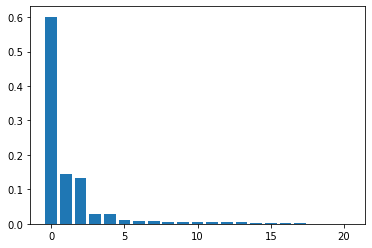

In [31]:
# Decision Tree Regression feature importance
DT_model = DecisionTreeRegressor()
DT_model.fit(X_train, y_train)
importance = DT_model.feature_importances_
DT_feature_importance = pd.DataFrame(list(zip(X_train.columns.values,importance)),
              columns=['Feature','Importance'])
DT_feature_importance_sorted = DT_feature_importance.iloc[DT_feature_importance['Importance'].abs().
                                                                      argsort()[::-1][:100]].reset_index(drop=True)
print(DT_feature_importance_sorted)
plt.bar([x for x in range(len(importance))], DT_feature_importance_sorted['Importance'])
plt.show()

`HIV/AIDS, Income_comp, Adult_mortality, Schooling, Under-five_deaths, Alcohol` show comparatively higher feature importance.

                 Feature  Importance
0               HIV/AIDS    0.604646
1        Adult_mortality    0.137628
2            Income_comp    0.132521
3              Schooling    0.027998
4      Under-five_deaths    0.017708
5                    BMI    0.011260
6                Alcohol    0.009749
7          Infant_deaths    0.008376
8    Thinness_5to9_years    0.007380
9                   Year    0.007331
10             Total_exp    0.005825
11  Thinness_1to19_years    0.005656
12                 Polio    0.004478
13               Measles    0.003790
14        Percentage_exp    0.003383
15            Population    0.003287
16                   GDP    0.003102
17            Diphtheria    0.002897
18           Hepatitis_B    0.002717
19             Developed    0.000140
20            Developing    0.000128


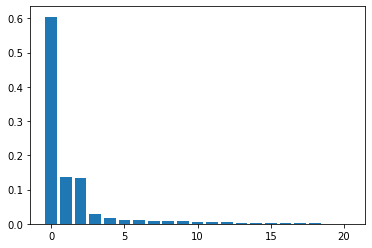

In [32]:
# Random Forest Regression feature importance
rf_model = RandomForestRegressor()
rf_model.fit(X_train, y_train)
importance = rf_model.feature_importances_
RF_feature_importance = pd.DataFrame(list(zip(X_train.columns.values,importance)),
              columns=['Feature','Importance'])
RF_feature_importance_sorted = RF_feature_importance.iloc[RF_feature_importance['Importance'].abs().
                                                                      argsort()[::-1][:100]].reset_index(drop=True)
print(RF_feature_importance_sorted)
plt.bar([x for x in range(len(importance))], RF_feature_importance_sorted['Importance'])
plt.show()

Similarily, `HIV/AIDS, Income_comp, Adult_mortality, Schooling, Under-five_deaths, Alcohol` show comparatively higher feature importance, and we can find the importance values for RF Regresssion are similar to DT Regression.

## 2. Clustering

Next, we explore the clustering to group countries based on various indicators, and thereby to map the gap among different groups in terms of Immunization related factors, Mortality factors, Economical factors and Social factors.

We first look into the average values derived from 2000-2015 data. With the elbow method, we could group countries into 4 clusters.

In [33]:
cluster_df = df.set_index('Country')
cluster_mean_df = cluster_df.groupby(['Country']).mean()
cluster_mean_df.drop(['Year'], axis = 1, inplace = True)

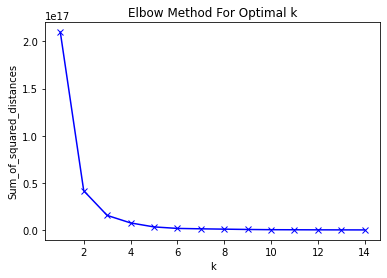

In [34]:
# choosing the best k
SSD = []
K = range(1,15)
for k in K:
    kmeans = KMeans(n_clusters=k)
    kmeanxqs = kmeans.fit(cluster_mean_df.to_numpy())
    SSD.append(kmeans.inertia_)
plt.plot(K, SSD, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [35]:
kmeans = KMeans(n_clusters=4)
kmeans_result = kmeans.fit_predict(cluster_mean_df.to_numpy())

In [36]:
cluster_mean_df['Cluster'] = kmeans_result
# cluster_df['Cluster'] = 'Cluster' + cluster_df['Cluster'].astype(str)
cluster_mean_df.head()

,Life_expectancy,Adult_mortality,Infant_deaths,Alcohol,Percentage_exp,Hepatitis_B,Measles,BMI,Under-five_deaths,Polio,...,HIV/AIDS,GDP,Population,Thinness_1to19_years,Thinness_5to9_years,Income_comp,Schooling,Developed,Developing,Cluster
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,58.19375,269.0625,78.2500,0.014375,34.960110,64.562500,2362.2500,15.51875,107.5625,48.3750,...,0.10000,340.015425,9.972260e+06,16.58125,15.58125,0.415375,8.21250,0,1,3
Albania,75.15625,45.0625,0.6875,4.848750,193.259091,98.000000,53.3750,49.06875,0.9375,98.1250,...,0.10000,2119.726679,6.969116e+05,1.61875,1.70000,0.709875,12.13750,0,1,0
Algeria,73.61875,108.1875,20.3125,0.406667,236.185241,78.000000,1943.8750,48.74375,23.5000,91.7500,...,0.10000,2847.853392,2.164983e+07,6.09375,5.97500,0.694875,12.71250,0,1,3
Angola,49.01875,328.5625,83.7500,5.740667,102.100268,70.222222,3561.3125,18.01875,132.6250,46.1250,...,2.36875,1975.143045,1.014710e+07,6.19375,6.66875,0.458375,8.04375,0,1,3
Antigua and Barbuda,75.05625,127.5000,0.0000,7.949333,1001.585226,98.266667,0.0000,38.42500,0.0000,96.9375,...,0.12500,9759.305728,1.273511e+07,3.42500,3.37500,0.488625,8.84375,0,1,3


In [37]:
cluster_mean_df['Code'] = [coco.convert(names=n, to='ISO3', not_found=None) for n in cluster_mean_df.index]

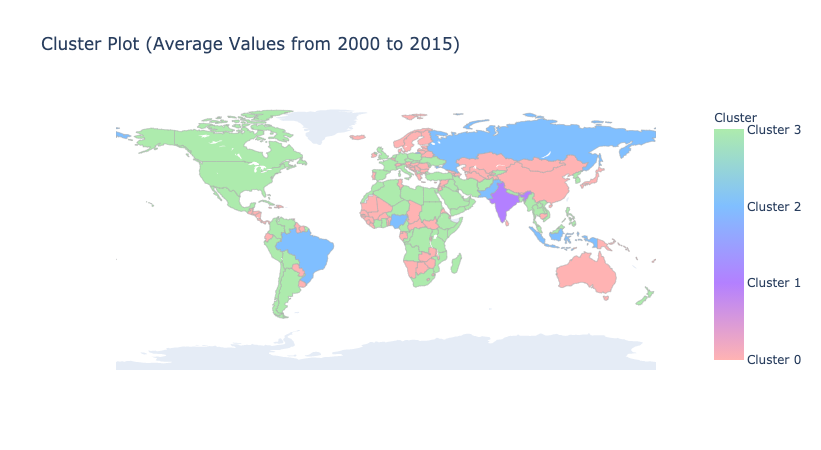

In [38]:
fig = go.Figure(data=go.Choropleth(
    locations = cluster_mean_df['Code'],
    z = cluster_mean_df['Cluster'],
    text = 'Cluster ' + cluster_mean_df['Cluster'].astype(str),
    #colorscale = 'RdYlGn',
    autocolorscale=False,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorscale = ['#ffb3b3', '#b380ff', '#80bfff', '#adebad'],
    colorbar_tickvals= list(range(len(cluster_mean_df['Cluster']))),
    colorbar_tickprefix = 'Cluster ',
    colorbar_title = 'Cluster',
))

fig.update_layout(
    title_text='Cluster Plot (Average Values from 2000 to 2015)',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    )
)

fig.show()

Here, we can notice the following pattern in the clustering of average value dataset:
- Similar to what we identified in the EDA map of the year 2015, high life expectancy regions like North America, Europe, as well as the West of South American share similar traits.
- Medium level life expectancy countries like Russia and Brazil also share likely traits.
- Noticably, countries in the Southern Africa are also classfied in the same cluster as those high life expectancy countries. 

The noticable difference made us doubt that even though some countries have similar distribution in economical, healthcare, and demographic features, it is still not matchable in life expectancy because of the lack of critical piece.

### 2015

We then look into the 2015 data, and also can group countries into 4 clusters. But this time, an obviously different pattern occurs. It seems reasonable since the year span is long, and some countries can have huge development during 15 years.

In [39]:
cluster_2015_df = cluster_df[cluster_df['Year'] == 2015]
cluster_2015_df.drop(['Year'], axis = 1, inplace = True)

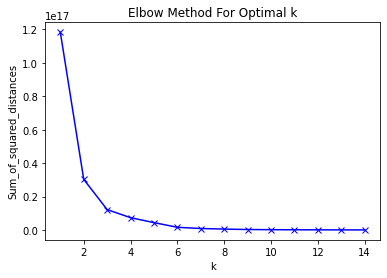

In [40]:
# choosing the best k
SSD = []
K = range(1,15)
for k in K:
    kmeans = KMeans(n_clusters=k)
    kmeanxqs = kmeans.fit(cluster_2015_df.to_numpy())
    SSD.append(kmeans.inertia_)
plt.plot(K, SSD, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [41]:
kmeans = KMeans(n_clusters=4)
kmeans_result = kmeans.fit_predict(cluster_2015_df.to_numpy())
cluster_2015_df['Cluster'] = kmeans_result
cluster_2015_df['Code'] = [coco.convert(names=n, to='ISO3', not_found=None) for n in cluster_2015_df.index]

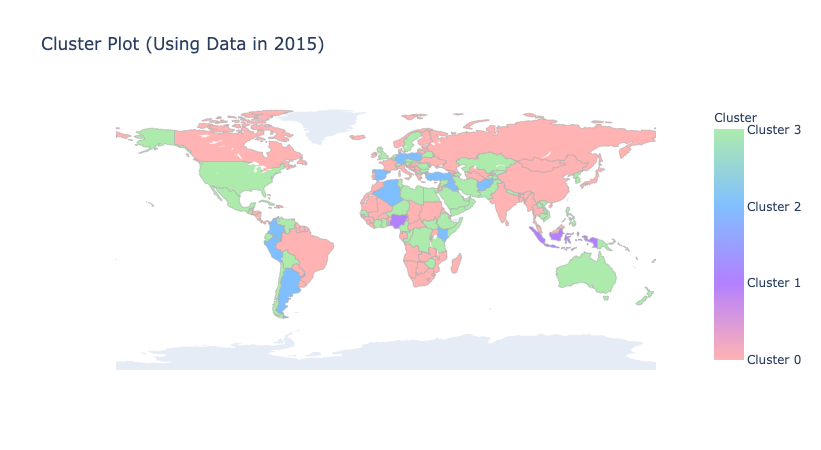

In [42]:
fig = go.Figure(data=go.Choropleth(
    locations = cluster_2015_df['Code'],
    z = cluster_2015_df['Cluster'],
    text = 'Cluster ' + cluster_2015_df['Cluster'].astype(str),
    #colorscale = 'RdYlGn',
    autocolorscale=False,
    marker_line_color='darkgray',
    marker_line_width=0.5,
    colorscale = ['#ffb3b3', '#b380ff', '#80bfff', '#adebad'],
    colorbar_tickvals= list(range(len(cluster_2015_df['Cluster']))),
    colorbar_tickprefix = 'Cluster ',
    colorbar_title = 'Cluster',
))

fig.update_layout(
    title_text='Cluster Plot (Using Data in 2015)',
    geo=dict(
        showframe=False,
        showcoastlines=False,
        projection_type='equirectangular'
    )
)

fig.show()

Here, we can notice the following pattern in the clustering of 2015 dataset:
- Similar to what we identified in EDA, high life expectancy countries like Australia, European countries, the USA , as well as a few South American country have similar traits.
- However, some Asian, North American, and South American countries share similar qualities. Those North American, and South American countries have high life expectancy while the others don't.
- The Southeaset Asian countries and Nigeria tent to have different traits than the rest of the world.

These differencies are due to their weighted results in economic, demograohic and healthcare level instead of directly based on development.


# Future Work

**Prediction:**
1. Try more models
2. Hyperparameter tuning
3. Add test accuracy based on selected models
4. Develop insights on models

**Clustering:**
- Improvement on Clustering: instead of using average values, we're ocnsidering perform K-Means Clustering on specific years such as 2000, 2005, 2010, 2015.

**Maybe - Classification:**
- Bin-sized classification: As Prof has discussed in the class, regression problem can also consider bin-sized on the y and perform classification. We plan to try it, but we're uncertain about how to bin-size reasonably.